## Data Augmentation - Albumentations 간단 실습

In [1]:
# 라이브러리 지정
import random
import cv2
import albumentations as A
from matplotlib import pyplot as plt

In [2]:
# 시각화 함수
def visualize(image):
    plt.figure(figsize = (10, 10))
    plt.axis('off')
    plt.imshow(image)

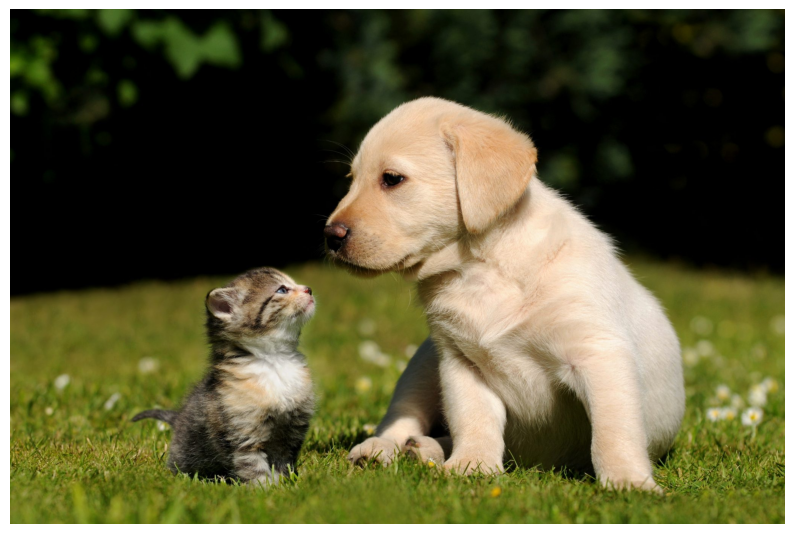

In [3]:
image = cv2.imread('catanddog.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
visualize(image)

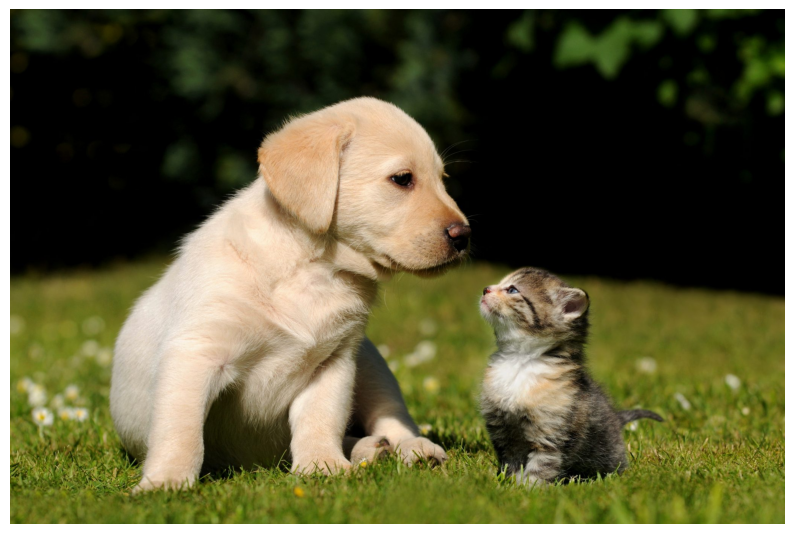

In [4]:
# 좌우 반전
transform = A.HorizontalFlip(p=0.5)
random.seed(7)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

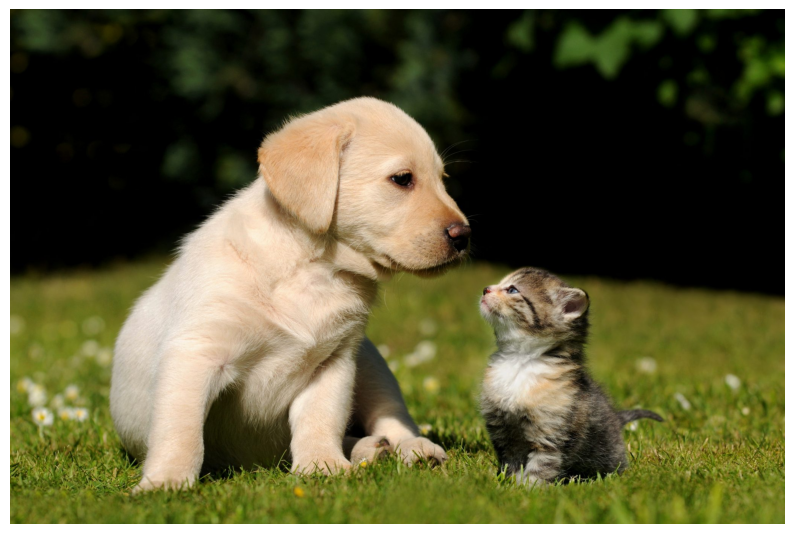

In [5]:
# ShiftScaleRotate
transfrom = A.ShiftScaleRotate(p=0.5)
random.seed(7)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

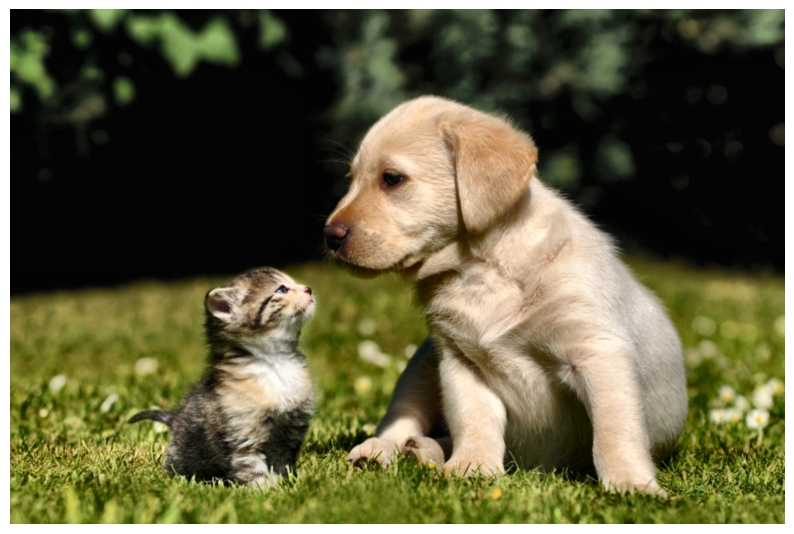

In [6]:
# 복잡한 파이프라인 구축하여 image aug 실행
transform = A.Compose([
    A.CLAHE(),
    A.RandomRotate90(),
    A.Transpose(),
    A.ShiftScaleRotate(shift_limit = 0.0625, scale_limit = 0.50, rotate_limit = 45, p=.75),
    A.Blur(blur_limit=3),
    A.OpticalDistortion(),
    A.GridDistortion(),
    A.HueSaturationValue(),
])
random.seed(42)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

C:\Users\smjin\anaconda3\envs\AI\lib\site-packages\albumentations\imgaug\transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
C:\Users\smjin\anaconda3\envs\AI\lib\site-packages\albumentations\imgaug\transforms.py:231: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
C:\Users\smjin\anaconda3\envs\AI\lib\site-packages\albumentations\imgaug\transforms.py:174: FutureWarning: This augmentation is deprecated. Please use Emboss instead
  warnings.warn("This augmentation is deprecated. Please use Emboss instead", FutureWarning)


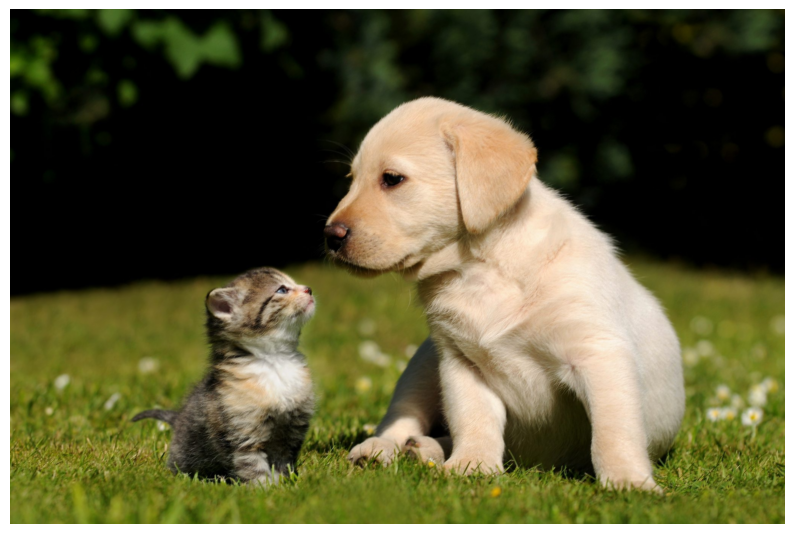

In [7]:
# 더 복잡한 파이프라인 구축
# Oneof는 주어진 몇 개의 Augmentation 중에서 랜덤하게 하나를 선택하여 적용
transform = A.Compose([
    A.RandomRotate90(),
    A.Flip(),
    A.Transpose(),
    A.OneOf([
        A.IAAAdditiveGaussianNoise(),
        A.GaussNoise(),
    ], p=0.2),
    A.OneOf([
        A.MotionBlur(p=.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    A.OneOf([
        A.MotionBlur(p=.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    A.OneOf([
        A.CLAHE(clip_limit=2),
        A.IAASharpen(),
        A.IAAEmboss(),
        A.RandomBrightnessContrast(),
    ], p=0.3),
    A.HueSaturationValue(p=0.3),
])
random.seed(42)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

## Data Augmentation - Albumentations 날씨 실습

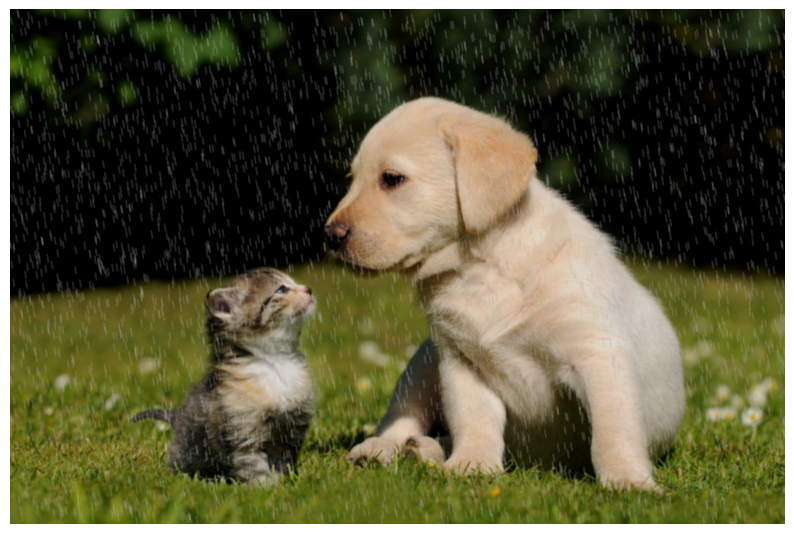

In [8]:
transform = A.Compose(
    [A.RandomRain(brightness_coefficient=0.9, drop_width=1, blur_value=5, p=1)],
)
random.seed(7)
transformed = transform(image=image)
visualize(transformed['image'])

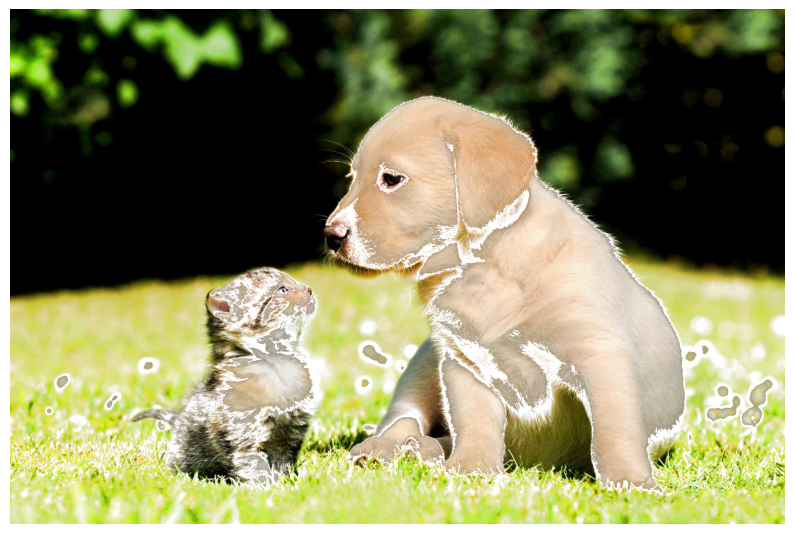

In [10]:
transform = A.Compose(
    [A.RandomSnow(brightness_coeff=2.5, snow_point_lower=0.3, snow_point_upper=0.5, p=1)],
)
random.seed(7)
transformed = transform(image=image)
visualize(transformed['image'])

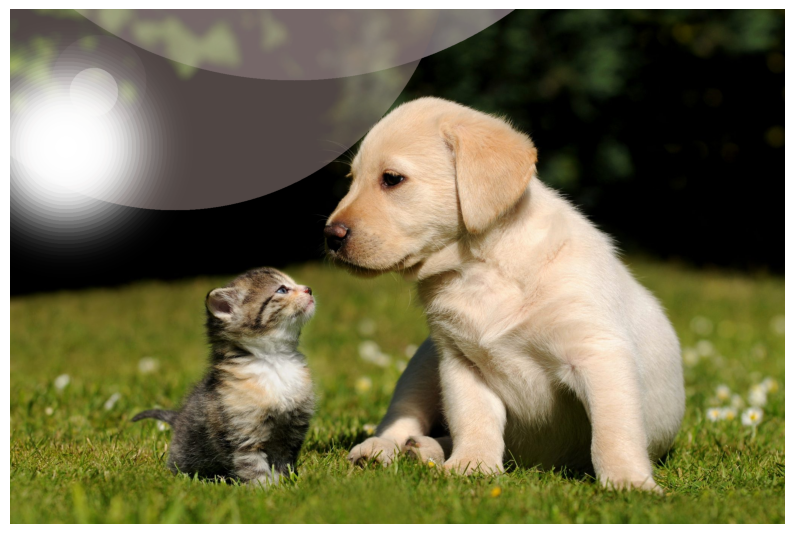

In [11]:
transform = A.Compose(
    [A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0.5, p=1)],
)
random.seed(7)
transformed = transform(image=image)
visualize(transformed['image'])

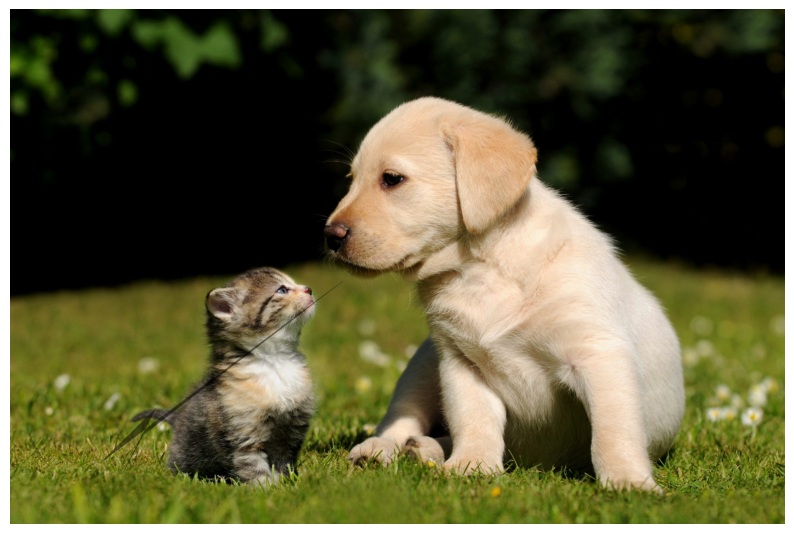

In [12]:
transform = A.Compose(
    [A.RandomShadow(num_shadows_lower=1, num_shadows_upper=1, shadow_dimension=5, shadow_roi=(0, 0.5, 1, 1), p=1)],
)
random.seed(7)
transformed = transform(image=image)
visualize(transformed['image'])

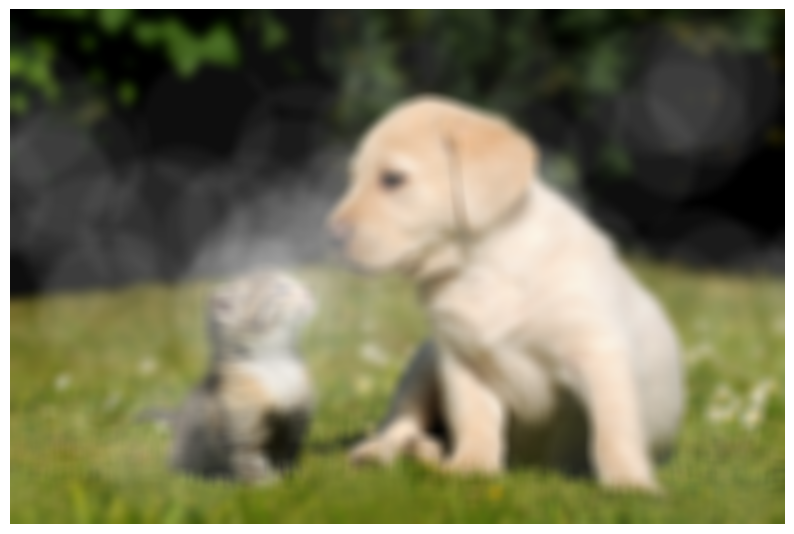

In [13]:
transform = A.Compose(
    [A.RandomFog(fog_coef_lower=0.4, fog_coef_upper=0.6, alpha_coef=0.1, p=1)],
)
random.seed(7)
transformed = transform(image=image)
visualize(transformed['image'])

## Using Albumentations to augment bounding boxes for object detection tasks
객체 감지(Object Detection) 작업을 위한 바운딩 박스 증강

In [14]:
BOX_COLOR = (255, 0, 0)    # Red
TEXT_COLOR = (255, 255, 255)   # White

# 바운딩 박스 그리기 함수
def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min+w), int(y_min), int(y_min + h)
    
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img

# 시각화 함수
def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)

    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

In [15]:
# 이미지 읽기
image = cv2.imread('./catanddog.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [41]:
# 해당 박스 정보
bboxes = [[414.23, 675.65, 415.75, 575.30], [824.39, 224.48, 950.66, 1050.89]]
category_ids = [0, 1]

# We will use the mapping from category_id to the class name
# to visualize the class label for the bounding box on the image
# 클래스 정보
category_id_to_name = {0 : 'cat', 1 : 'dog'}

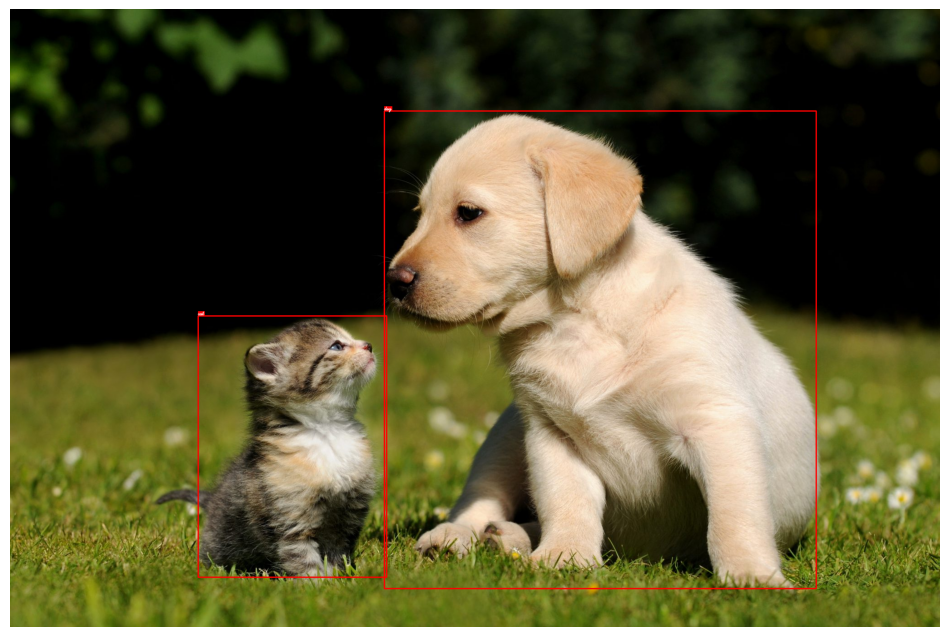

In [42]:
# Visualize the original image with boundgin boxes
visualize(image, bboxes, category_ids, category_id_to_name)

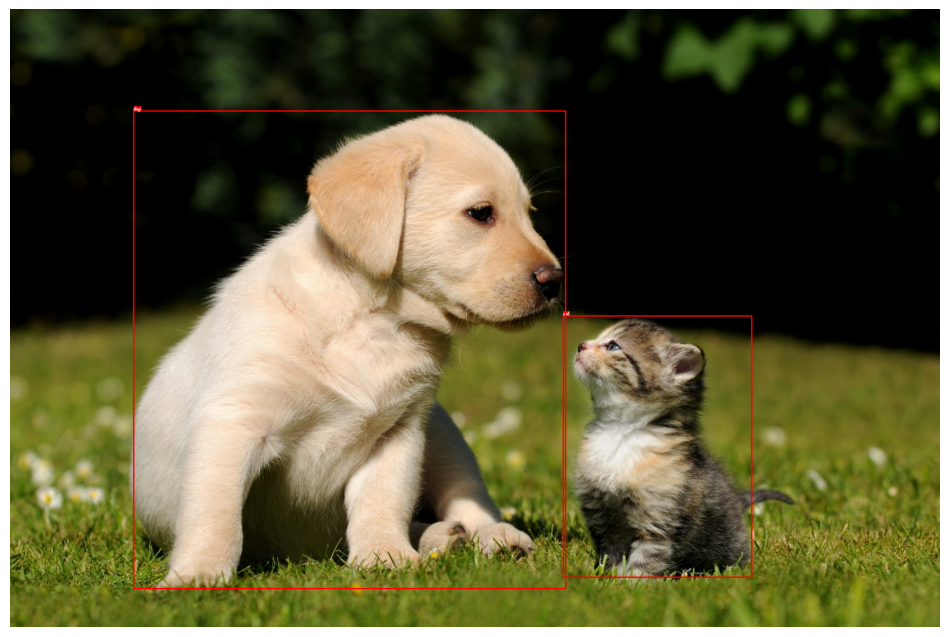

In [43]:
# 좌우 반전 진행 실습
transform = A.Compose(
    [A.HorizontalFlip(p=0.5)],
    bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']),
)

random.seed(7)
transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name,
)

## shiftScaleRotate

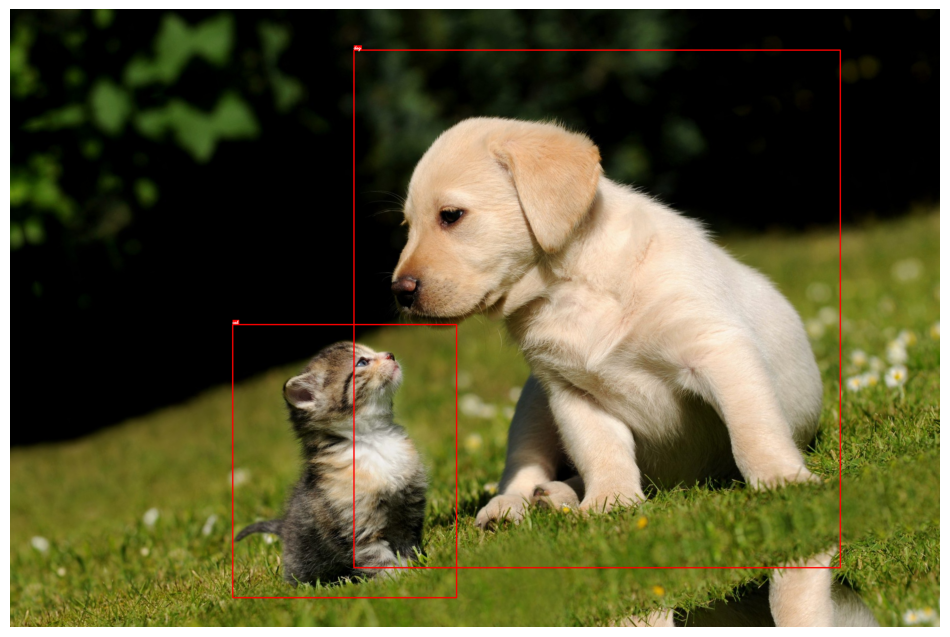

In [45]:
transform = A.Compose(
    [A.ShiftScaleRotate(p=0.5)],
    bbox_params = A.BboxParams(format='coco', label_fields=['category_ids']),
)

random.seed(7)
transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name,
)

## 복잡한 Augmentation 파이프라인 정의하기

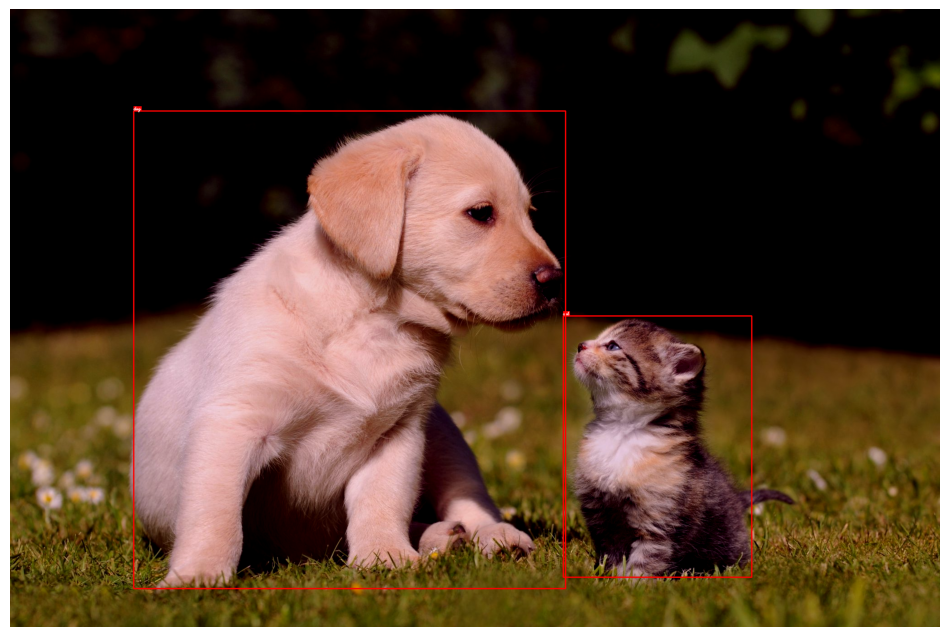

In [47]:
transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.RGBShift(r_shift_limit=30, g_shift_limit=30, b_shift_limit=30, p=0.3),
    ],
    bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']),
)

random.seed(7)
transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name,
)

## 공간적 보강 실습

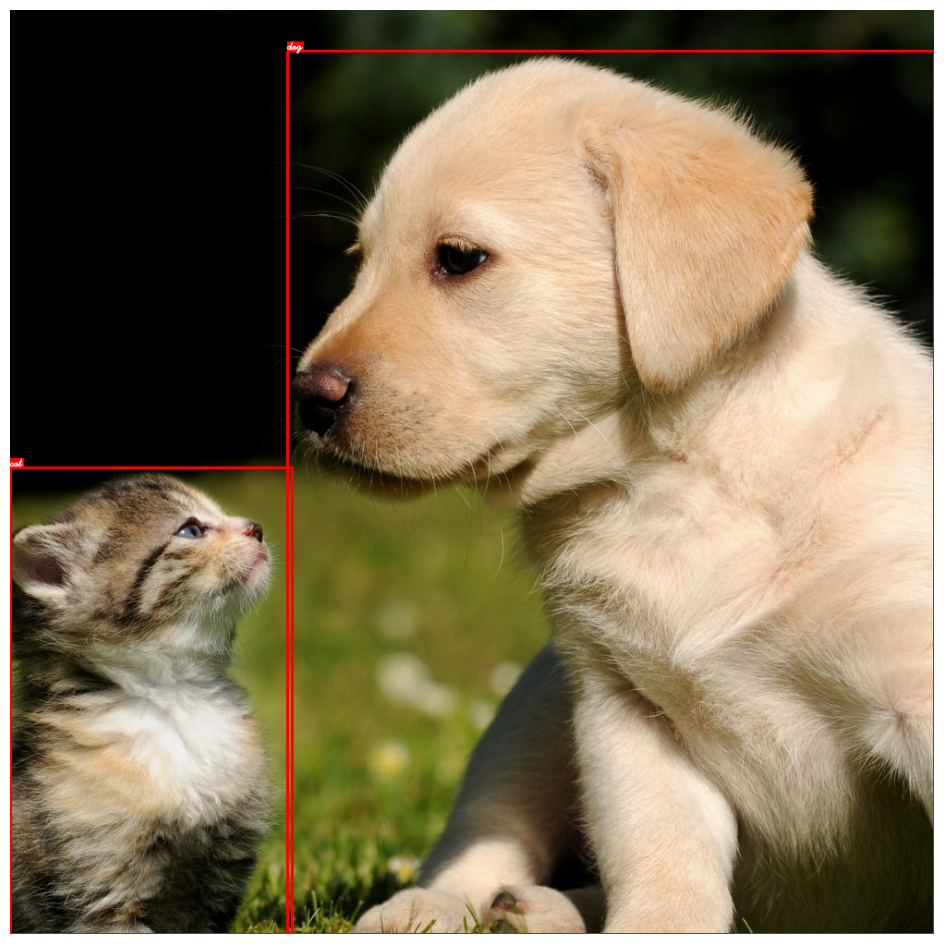

In [52]:
transform = A.Compose(
    [A.CenterCrop(height=1000, width=1000, p=1)],
    bbox_params=A.BboxParams(format='coco', min_area=4500, label_fields=['category_ids']),
)

transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name,
)